In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
import os


## Reading data and creating patches
### gdrive should have images folder from BSDS500

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd gdrive/MyDrive

Mounted at /content/gdrive
/content/gdrive/MyDrive


In [ ]:
os.mkdir('images/train_patches')
os.mkdir('images/test_patches')

FileExistsError: ignored

In [ ]:
def generate_patches(path,p_size,cr,save=''):
  img=cv2.imread(path)
  plt.imshow(img)
  patches=[]
  path=path.split('/')[-1]
  path=path.split('.')[0]
  for c in cr:
    h,w=int(img.shape[0]*c),int(img.shape[1]*c)
    img_sc=cv2.resize(img, (h,w), interpolation=cv2.INTER_CUBIC)
    for i in range(0,h-p_size+1,p_size):
      for j in range(0,w-p_size+1,p_size):
        patch=img[i:i+p_size,j:j+p_size]
        patches.append(patch)
        if save!='':
          path1=save+'/'+path+str(i)+str(h)+str(j)+'.jpg'
          cv2.imwrite(path1,patch)
  return patches
def genimage(patches,size):
  img=np.zeros(size)
  p_size=patches.shape[1]
  p=0
  for i in range(0,img.shape[0]-p_size+1,p_size):
    for j in range(0,img.shape[1]-p_size+1,p_size):
      img[i:i+p_size,j:j+p_size]=patches[p]
      p+=1
  return np.array(img)

In [ ]:
def gen_data(img_dir,cr,p_size,save=''):
  images=os.listdir(img_dir)
  data=[]
  for i in images:
    # print(i)
    if i.split('.')[-1]=='jpg':
      data+=generate_patches(img_dir+'/'+i,p_size,cr,save)
  return data
      

# This cell should run only once to gen patches in the gdrive

In [ ]:
cr = [1, 0.8, 0.7,0.6]
p_size=40

In [ ]:
gen_data('images/test',cr,p_size,'images/test_patches')
gen_data('images/train',cr,p_size,'images/train_patches')
print()

### Testing

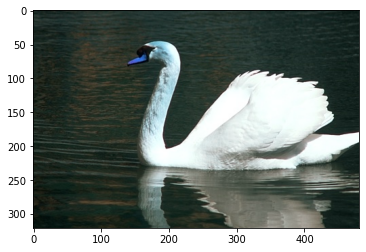

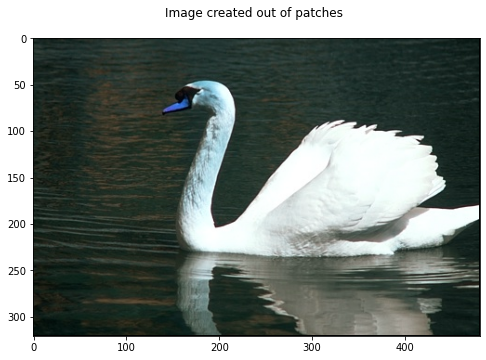

In [ ]:
patches=generate_patches("images/train/8068.jpg",40,[1]) 
test_image=cv2.imread('images/train/8068.jpg')
patches=np.array(patches)
image_created=genimage(patches,test_image.shape)
fig= plt.figure(figsize=(8,8))
plt.imshow(image_created/255.)
plt.title('Image created out of patches \n')
plt.show()

In [ ]:
trainfilenames=os.listdir('images/train_patches')
testfilenames=os.listdir('images/test_patches')
print(len(trainfilenames), len(testfilenames))

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import Model
import datetime

### Preparing Dataset

In [ ]:

for i in range(len(trainfilenames)):
  trainfilenames[i]='images/train_patches/'+trainfilenames[i]
for i in range(len(testfilenames)):
  testfilenames[i]='images/test_patches/'+testfilenames[i]

In [ ]:
def addnoise(filename):
  img_raw=tf.io.read_file(filename)
  print(img_raw)
  img = tf.image.decode_jpeg(img_raw, channels=3)
  img = tf.cast(img, tf.float32)/255.
  noise_level=np.random.choice(NOISE_LEVELS)
  noisy_image=img+tf.random.normal(shape=(p_size,p_size,3),mean=0,stddev=noise_level/255)
  noisy_image=tf.clip_by_value(noisy_image, clip_value_min=0., clip_value_max=1.)
  return noisy_image,img

def calc_PSNR(im1,im2,max):
  temp=np.mean((im1-im2)**2)
  if temp==0:
    return 100
  else:
    return 20*np.log10(max/ (np.sqrt(temp)))

def predict_fun(model,image_path,noise_level=30):
  #Creating patches for test image
  patches=np.asarray(generate_patches(image_path,p_size,[1],''))
  test_image=cv2.imread(image_path)

  # ground_truth=genimage(patches,test_image.shape)

  #predicting the output on the patches of test image
  patches = patches.astype('float32') /255.
  patches = patches+ tf.random.normal(shape=patches.shape,mean=0,stddev=noise_level/255) 
  patches = tf.clip_by_value(patches, clip_value_min=0., clip_value_max=1.)
  noisy_image=genimage(patches,test_image.shape)

  denoised_patches=model.predict(patches)
  denoised_patches=tf.clip_by_value(denoised_patches, clip_value_min=0., clip_value_max=1.)

  #Creating entire denoised image from denoised patches
  out_img=genimage(denoised_patches,test_image.shape)

  return patches,denoised_patches,test_image/255.,noisy_image,out_img
def plot(noiseless,noisy,out_img):
  fig = plt.figure(figsize=(100, 100))
  fig.add_subplot(5, 5, 1)
  plt.imshow(noiseless)
  fig.add_subplot(5, 5, 2)
  plt.imshow(noisy)
  fig.add_subplot(5, 5, 3)
  plt.imshow(out_img)
  plt.show()


In [ ]:
plot(cv2.imread('images/test/8068.jpg'),cv2.imread('images/test/8068.jpg'),cv2.imread('images/test/8068.jpg'))

In [ ]:
BATCH_SIZE=64
NOISE_LEVELS=[15,25,50] 

#Creating the Dataset
train_dataset = tf.data.Dataset.from_tensor_slices(np.array(trainfilenames)) 
train_dataset = train_dataset.map(addnoise)
train_dataset = train_dataset.batch(BATCH_SIZE)

test_dataset = tf.data.Dataset.from_tensor_slices(np.array(testfilenames))
test_dataset = test_dataset.map(addnoise)
test_dataset = test_dataset.batch(BATCH_SIZE)

Tensor("ReadFile:0", shape=(), dtype=string)
Tensor("ReadFile:0", shape=(), dtype=string)


# RIDNET Model

In [ ]:
def RIDNET():
  def EAM(input):
    x=layers.Conv2D(64, (3,3), dilation_rate=1,padding='same',activation='relu')(input)
    x=layers.Conv2D(64, (3,3), dilation_rate=2,padding='same',activation='relu')(x)

    y=layers.Conv2D(64, (3,3), dilation_rate=3,padding='same',activation='relu')(input)
    y=layers.Conv2D(64, (3,3), dilation_rate=4,padding='same',activation='relu')(y)

    z=layers.Concatenate(axis=-1)([x,y])
    z=layers.Conv2D(64, (3,3),padding='same',activation='relu')(z)
    add_1=layers.Add()([z, input])

    z=layers.Conv2D(64, (3,3),padding='same',activation='relu')(add_1)
    z=layers.Conv2D(64, (3,3),padding='same')(z)
    add_2=layers.Add()([z,add_1])
    add_2 = layers.Activation('relu')(add_2)

    z=layers.Conv2D(64, (3,3),padding='same',activation='relu')(add_2)
    z=layers.Conv2D(64, (3,3),padding='same',activation='relu')(z)
    z=layers.Conv2D(64, (1,1),padding='same')(z)
    add_3=layers.Add()([z,add_2])
    add_3 = layers.Activation('relu')(add_3)

    z = layers.GlobalAveragePooling2D()(add_3)
    z = tf.expand_dims(z,1)
    z = tf.expand_dims(z,1)
    z=layers.Conv2D(4, (3,3),padding='same',activation='relu')(z)
    z=layers.Conv2D(64, (3,3),padding='same',activation='sigmoid')(z)
    mul=layers.Multiply()([z, add_3])

    return mul

  input=layers.Input((p_size,p_size,3),name='in')
  f0=layers.Conv2D(64,(3,3),padding='same')(input)
  fr1=EAM(f0)
  fr2=EAM(fr1)
  fr3=EAM(fr2)
  fr4=EAM(fr3)
  temp=layers.Conv2D(3, (3,3),padding='same')(fr4)
  add=layers.Add()([temp, input])
  model = Model(input,add)
  return model

def lrscheduler(epoch,lr):
  return lr*0.95

In [ ]:
tf.keras.backend.clear_session()
tf.random.set_seed(6908)
ridnet = RIDNET()
ridnet.compile(optimizer=tf.keras.optimizers.Adam(1e-03),loss=tf.keras.losses.MeanAbsoluteError())


In [ ]:
ridnet.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in (InputLayer)                [(None, 40, 40, 3)]  0           []                               
                                                                                                  
 conv2d (Conv2D)                (None, 40, 40, 64)   1792        ['in[0][0]']                     
                                                                                                  
 conv2d_1 (Conv2D)              (None, 40, 40, 64)   36928       ['conv2d[0][0]']                 
                                                                                                  
 conv2d_3 (Conv2D)              (None, 40, 40, 64)   36928       ['conv2d[0][0]']                 
                                                                                              

In [ ]:
checkpoint_path = "ridnet.h5" # For each epoch creaking a checkpoint
checkpoint_dir = os.path.dirname(checkpoint_path)
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,save_weights_only=False,verbose=0,save_best_only=False) # To save the model if the metric is improved

# Tensorbaord 
! rm -rf ./logs_ridnet/  # Removing all the files present in the directory
logdir = os.path.join("logs_ridnet", datetime.datetime.now().strftime("%Y%m%d-%H%M%S")) # Directory for storing the logs that are required for tensorboard
%reload_ext  tensorboard
%tensorboard --logdir $logdir
tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

lrScheduler1 = tf.keras.callbacks.LearningRateScheduler(lrscheduler)

callbacks = [cp_callback,tensorboard_callback,lrScheduler1]
ridnet.fit( train_dataset,shuffle=True,epochs=10,validation_data= test_dataset,callbacks=callbacks)

<IPython.core.display.Javascript object>

Epoch 1/10
1363/1363 [==============================] - 998s 716ms/step - loss: 0.0214 - val_loss: 0.0314 - lr: 9.5000e-04
Epoch 2/10
1363/1363 [==============================] - 942s 691ms/step - loss: 0.0173 - val_loss: 0.0308 - lr: 9.0250e-04
Epoch 3/10
1363/1363 [==============================] - 942s 691ms/step - loss: 0.0168 - val_loss: 0.0316 - lr: 8.5737e-04
Epoch 4/10
1363/1363 [==============================] - 942s 691ms/step - loss: 0.0166 - val_loss: 0.0320 - lr: 8.1451e-04
Epoch 5/10
1363/1363 [==============================] - 944s 693ms/step - loss: 0.0163 - val_loss: 0.0323 - lr: 7.7378e-04
Epoch 6/10
1363/1363 [==============================] - 942s 691ms/step - loss: 0.0162 - val_loss: 0.0325 - lr: 7.3509e-04
Epoch 7/10
1363/1363 [==============================] - 940s 690ms/step - loss: 0.0161 - val_loss: 0.0328 - lr: 6.9834e-04
Epoch 8/10
1363/1363 [==============================] - 942s 691ms/step - loss: 0.0159 - val_loss: 0.0328 - lr: 6.6342e-04
Epoch 9/10
1363/

PSNR of Noisy Image :  20.38908140771515
PSNR of Denoised Image :  26.941787768126563


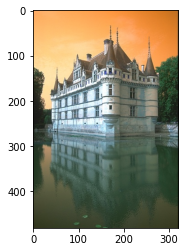

In [ ]:
patches,denoised_patches,test_image,noisy_image,out_img=predict_fun(ridnet,'images/test/102061.jpg',noise_level=25)
print('PSNR of Noisy Image : ',calc_PSNR(test_image,noisy_image,1))
print('PSNR of Denoised Image : ',calc_PSNR(test_image,out_img,1))

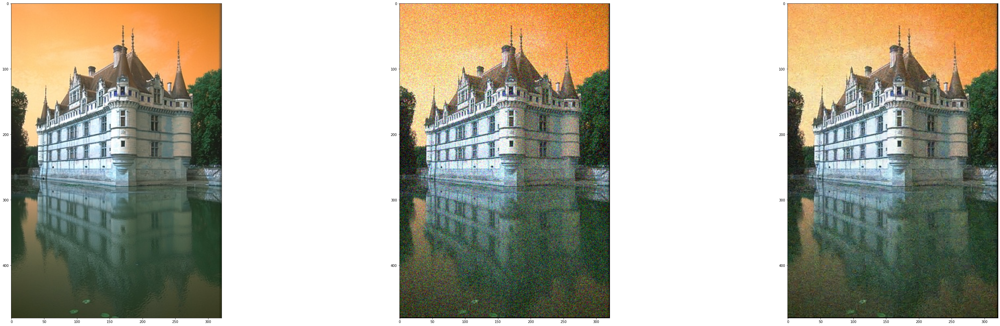

In [ ]:
plot(test_image,noisy_image,out_img)

In [ ]:
# ridnet.save('/content/ridnet.h5')
ridnet=tf.keras.models.load_model("/content/ridnet.h5")

In [ ]:
ridnet.fit( train_dataset,shuffle=True,epochs=30,initial_epoch=10,validation_data= test_dataset,callbacks=callbacks)

Epoch 11/30
1363/1363 [==============================] - 946s 694ms/step - loss: 0.0156 - val_loss: 0.0335 - lr: 5.6880e-04
Epoch 12/30
1363/1363 [==============================] - 953s 699ms/step - loss: 0.0155 - val_loss: 0.0335 - lr: 5.4036e-04
Epoch 13/30
 232/1363 [====>.........................] - ETA: 12:01 - loss: 0.0162

PSNR of Noisy Image :  20.40501260626467
PSNR of Denoised Image :  30.29151354755917


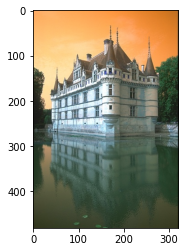

In [ ]:
patches,denoised_patches,test_image,noisy_image,out_img=predict_fun(ridnet,'images/test/102061.jpg',noise_level=25)
print('PSNR of Noisy Image : ',calc_PSNR(test_image,noisy_image,1))
print('PSNR of Denoised Image : ',calc_PSNR(test_image,out_img,1))

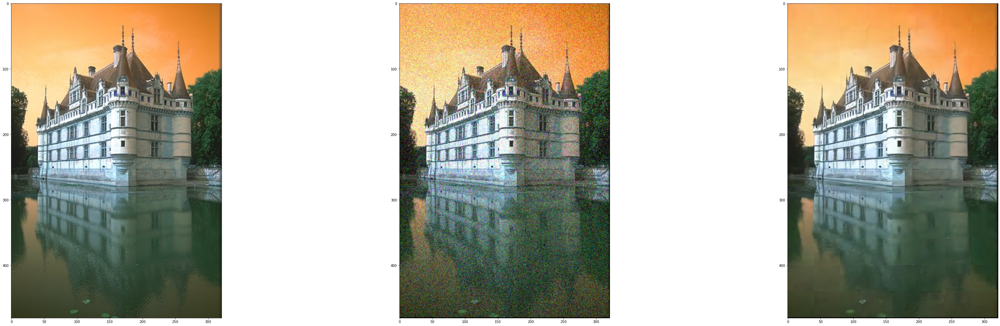

In [ ]:
plot(test_image,noisy_image,out_img)